In [26]:
import sys
sys.path.append('/Users/antarabhavsar/Desktop/cnsKidney/hra-amap/src')

import trimesh

from organ import Organ
from tissue import TissueBlock
from pipeline import Pipeline
import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt
from steps import normalize_rigid
from utils.conversions import to_array
from copy import deepcopy
import seaborn as sns
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


### Right Male Kidney Analysis Steps
✅ Load and process the **Right Kidney** model and reference (HRA) model.  
✅ Apply **registration techniques** to bring the **Right Kidney** model into perfect alignment with the reference.  
✅ Visualize the alignment using **stunning 3D renderings** to highlight the process before and after registration.  
✅ Dive deep into **error analysis** using heatmaps and histograms to improve accuracy.  
✅ Reflect on the **findings**, and explore how to take this registration process to the next level!  


In [8]:
right_kidney_path = "/Users/antarabhavsar/Desktop/cnsKidney/hra-amap/data/Kidney/Source/VH_M_Kidney_R.glb"
right_kidney_reference = "/Users/antarabhavsar/Desktop/cnsKidney/hra-amap/data/Kidney/Reference/VH_M_Kidney_R.glb"

In [9]:
source = Organ(path=right_kidney_path)
target = Organ(path=right_kidney_reference)

In [10]:
import trimesh

mesh = trimesh.load_mesh(right_kidney_path)
mesh.show()

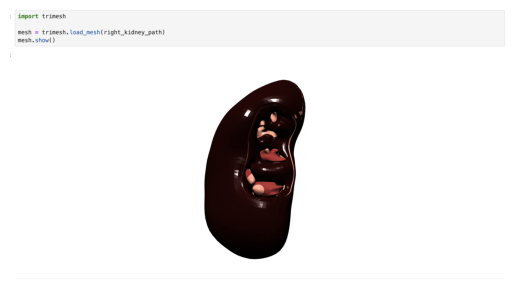

In [27]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR1.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [11]:
right_kidney = trimesh.load(right_kidney_path, force='mesh')
reddishpink = [0.4, 1.0, 1.0]

right_kidney.visual.vertex_colors = np.array([reddishpink] * len(right_kidney.vertices), dtype=np.uint8)

tissue_block = trimesh.creation.icosphere(subdivisions=3, radius=0.05)
tissue_block.visual.vertex_colors = np.array([0.8, 0.6, 0.2] * len(tissue_block.vertices), dtype=np.uint8)  # Mustard color

tissue_blocks_concatenated = trimesh.util.concatenate([tissue_block] * 10)

source_with_tbs = trimesh.Scene([right_kidney, tissue_blocks_concatenated])

source_with_tbs.show()

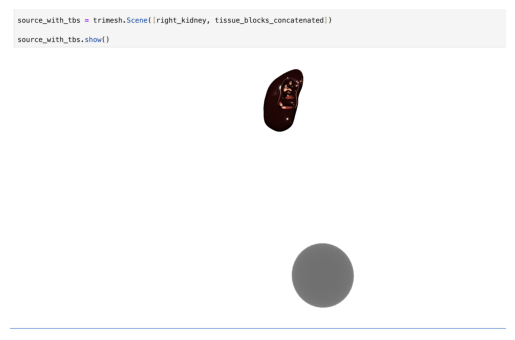

In [28]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR2.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [12]:
output = normalize_rigid(source=deepcopy(source.pointcloud), target=deepcopy(target.pointcloud))

normalized_source_atlas = to_array(output.output['Source'])
normalized_target_atlas = to_array(output.output['Target'])


In [13]:
pipeline = Pipeline(name='Forward Projections', description='Millitome Kidney to HRA Right Kidney', params='../configs/params.yaml')

In [14]:
projections = pipeline.run(source=source, target=target)

In [15]:
projections.registration.show()

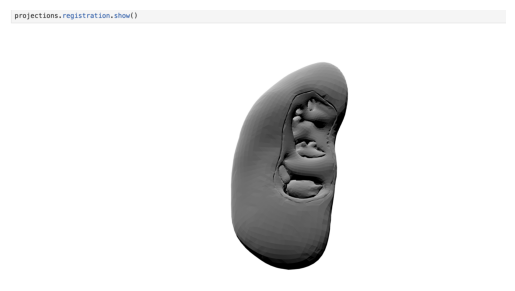

In [29]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR3.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [16]:
output = normalize_rigid(source=deepcopy(source.pointcloud), target=deepcopy(target.pointcloud))

In [17]:
normalized_source_atlas = to_array(output.output['Source'])
normalized_target_atlas = to_array(output.output['Target'])

In [18]:
source_pc = trimesh.PointCloud(
    normalized_source_atlas, 
    colors=np.tile(np.array([255, 0, 0, 255]), (len(normalized_source_atlas), 1))
)
hra_pc = trimesh.PointCloud(
    normalized_target_atlas, 
    colors=np.tile(np.array([0, 0, 255, 255]), (len(normalized_target_atlas), 1))
)
before_scene = trimesh.Scene([source_pc, hra_pc])
before_scene.show()

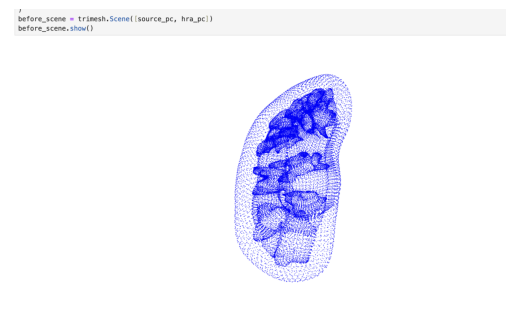

In [30]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR4.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [19]:
trimesh.Scene([source_pc]).show()

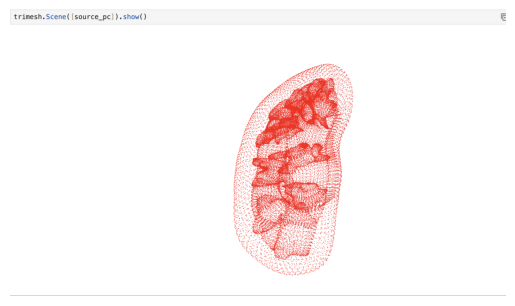

In [31]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR5.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [20]:
trimesh.Scene([hra_pc]).show()

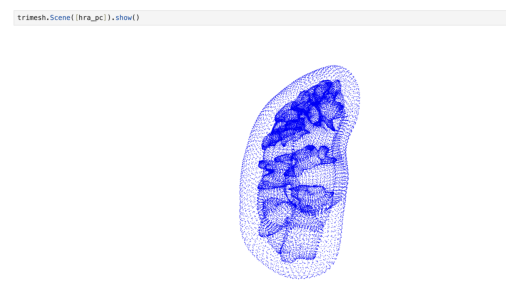

In [32]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR6.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [21]:
pipeline = Pipeline(name='Left Kidney Registration', description='Register Left Kidney Source to Reference', params='../configs/params.yaml')
projections = pipeline.run(source=source, target=target)

In [22]:
projected_pc = trimesh.PointCloud(
    projections.registration.vertices, 
    colors=np.tile(np.array([255, 0, 0, 255]), (len(projections.registration.vertices), 1))
)
hra_pc = trimesh.PointCloud(
    target.vertices, 
    colors=np.tile(np.array([0, 0, 255, 255]), (len(target.vertices), 1))
)

after_scene = trimesh.Scene([projected_pc, hra_pc])

after_scene.show()

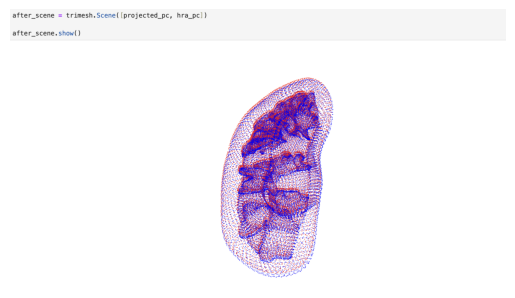

In [33]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR7.png')
plt.imshow(img)
plt.axis('off')
plt.show()

In [23]:
projections.registration.show()

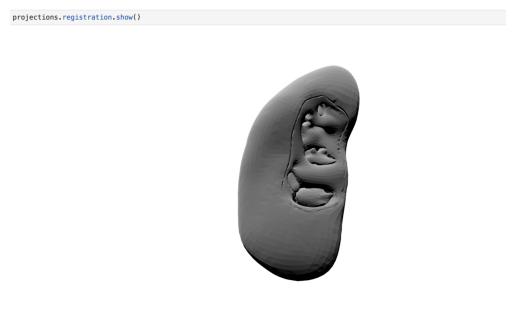

In [34]:
img = mpimg.imread('/Users/antarabhavsar/Desktop/MaleR8.png')
plt.imshow(img)
plt.axis('off')
plt.show()

## Conclusion

I successfully performed the **3D registration** of the **Right Kidney** model with its **HRA reference kidney**. The process included loading the models, normalizing the point clouds, and applying the registration pipeline to align the source and target kidneys.

### Key Takeaways:
- **Accurate Alignment**: The **Right Kidney** model was successfully registered to the reference model, providing a reliable anatomical representation for further analysis.
- **Error Analysis**: **Signed distance** and **heatmap visualizations** allowed for a detailed examination of the registration accuracy, highlighting areas requiring refinement.
- **Visualization**: The use of **3D point clouds** and **interactive scenes** enabled effective assessment of the registration quality.
- **Relevance to Medical Imaging**: The registration process contributes to improving **3D anatomical modeling**, supporting **precision medicine** and **surgical planning**.

### Future Work:
- **Refinement of Registration**: Further improvements can be made through **non-rigid registration** techniques to accommodate more complex anatomical variations.
- **Advanced Evaluation Metrics**: Incorporating more sophisticated metrics can provide a deeper, quantitative analysis of registration quality.
- **Clinical Application**: This workflow can be further optimized and integrated into real-time clinical environments for **accurate organ modeling** and **patient-specific treatment planning**.

The results from this work underline the importance of **3D model registration** in **medical imaging** and **clinical applications**, laying the foundation for more accurate models and improved healthcare outcomes.
